1. Install Depedensi

In [1]:
import json
import shutil
import random
from pathlib import Path
from collections import Counter
import shutil

import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

In [2]:
DATASET_ROOT = Path(r"/kaggle/input/datasets/ihsanaliandi/dataset-lomba/Telepati 8.0 Datasets")
YOLO_OUT = Path(r"/kaggle/working/YOLO_Dataset")

FILE_ANOTASI_COCO = "_annotations.coco.json"

SPLITS = ["train", "valid", "test"]

SEED = 42

random.seed(SEED)
np.random.seed(SEED)

In [3]:
for split in SPLITS:

    split_dir = DATASET_ROOT / split
    json_path = split_dir / FILE_ANOTASI_COCO

    print(f"\n[{split}]")
    print("Folder :", split_dir)
    print("JSON   :", json_path)
    print("JSON exists :", json_path.exists())


[train]
Folder : /kaggle/input/datasets/ihsanaliandi/dataset-lomba/Telepati 8.0 Datasets/train
JSON   : /kaggle/input/datasets/ihsanaliandi/dataset-lomba/Telepati 8.0 Datasets/train/_annotations.coco.json
JSON exists : True

[valid]
Folder : /kaggle/input/datasets/ihsanaliandi/dataset-lomba/Telepati 8.0 Datasets/valid
JSON   : /kaggle/input/datasets/ihsanaliandi/dataset-lomba/Telepati 8.0 Datasets/valid/_annotations.coco.json
JSON exists : True

[test]
Folder : /kaggle/input/datasets/ihsanaliandi/dataset-lomba/Telepati 8.0 Datasets/test
JSON   : /kaggle/input/datasets/ihsanaliandi/dataset-lomba/Telepati 8.0 Datasets/test/_annotations.coco.json
JSON exists : True


In [4]:
def cek_coco(json_path):

    data = json.loads(
        json_path.read_text(encoding="utf-8")
    )

    images = {
        img["id"]: img
        for img in data["images"]
    }

    categories = {
        cat["id"]: cat["name"]
        for cat in data["categories"]
    }

    image_ids = set(images.keys())

    Anotasi_per_image = {}

    for anotasi in data["annotations"]:

        Anotasi_per_image.setdefault(
            anotasi["image_id"], []
        ).append(anotasi)

    gambar_tanpa_anotasi = [
        gambar
        for id_gambar, gambar in images.items()
        if id_gambar not in Anotasi_per_image
    ]

    invalid_bbox = []

    for anotasi in data["annotations"]:

        if anotasi["image_id"] not in images:
            continue

        img = images[anotasi["image_id"]]

        W = img["width"]
        H = img["height"]

        bbox = anotasi.get("bbox")

        if (
            bbox is None
            or len(bbox) != 4
            or bbox[2] <= 0
            or bbox[3] <= 0
        ):
            invalid_bbox.append(anotasi)
            continue

        x, y, w, h = bbox

        if (
            x < 0
            or y < 0
            or x + w > W
            or y + h > H
        ):
            invalid_bbox.append(anotasi)

    class_counts = Counter()

    for anotasi in data["annotations"]:

        nama = categories.get(
            anotasi["category_id"],
            "UNKNOWN"
        )

        class_counts[nama] += 1

    print(f"Gambar              : {len(images)}")
    print(f"Anotasi            : {len(data['annotations'])}")
    print(f"Gambar tanpa anotasi : {len(gambar_tanpa_anotasi)}")
    print(f"Bbox invalid/outside    : {len(invalid_bbox)}")

    print("Distribusi kategori:")

    for name, count in class_counts.most_common():
        print(f"{name:<35}: {count}")

    return data

In [5]:
data_coco= {}

for split in SPLITS:

    json_path = DATASET_ROOT / split / FILE_ANOTASI_COCO
    print(f"AUDIT {split.upper()}")

    data_coco[split] = cek_coco(json_path)

AUDIT TRAIN
Gambar              : 10133
Anotasi            : 20163
Gambar tanpa anotasi : 59
Bbox invalid/outside    : 427
Distribusi kategori:
BrownSpot                          : 3388
Blast                              : 3033
Rice-Tungro                        : 2540
Sheath Blight                      : 1762
Brown spot                         : 1622
Leaf Scald                         : 1224
False-Smut                         : 852
Infected Blast                     : 832
Leaf-roller                        : 812
Healthy Rice Leaf                  : 717
Healthy Rice beads                 : 699
Healthy                            : 686
Bacterial panicle Blight           : 528
Bacterial leaf blight              : 476
Leaf blast                         : 284
healthy                            : 272
Narrow brown                       : 222
Leaf scald                         : 214
AUDIT VALID
Gambar              : 2106
Anotasi            : 4888
Gambar tanpa anotasi : 13
Bbox invalid/outside 

Jumlah gambar tanpa bounding box: 59


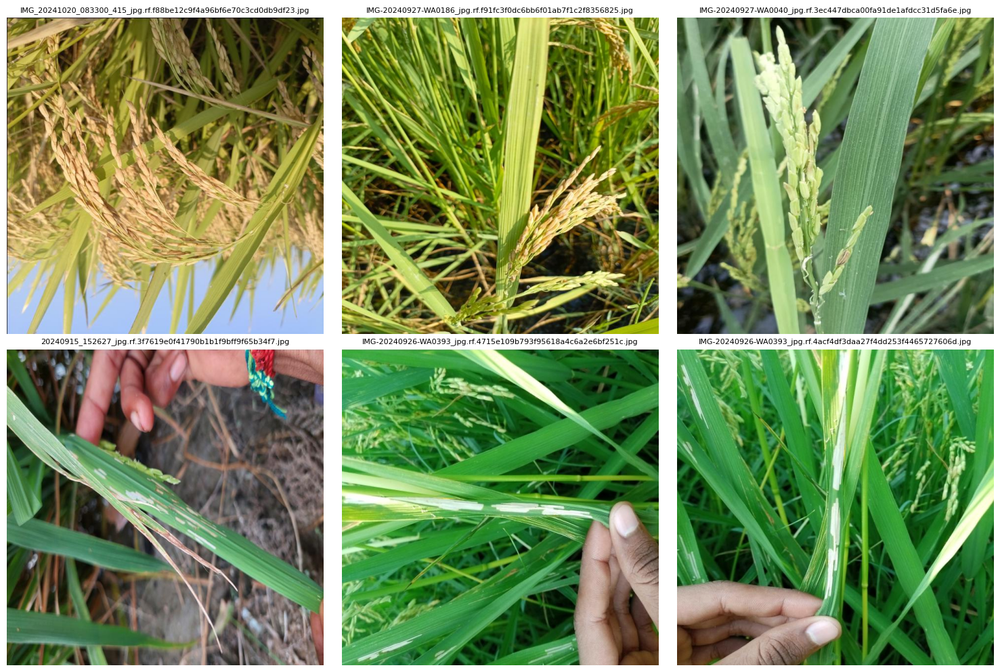

In [6]:
import json
import matplotlib.pyplot as plt
from PIL import Image
import os


IMG_DIR = "/kaggle/input/datasets/ihsanaliandi/dataset-lomba/Telepati 8.0 Datasets/train"  # ganti dengan folder gambar kamu
JSON_PATH_TRAIN="/kaggle/input/datasets/ihsanaliandi/dataset-lomba/Telepati 8.0 Datasets/train/_annotations.coco.json"
# Load anotasi
with open(JSON_PATH_TRAIN) as f:
    data = json.load(f)

# Cari image_id yang punya bounding box
img_ids_with_bbox = set(ann['image_id'] for ann in data['annotations'])

# Ambil gambar yang TIDAK punya bounding box
no_bbox_images = [img for img in data['images'] if img['id'] not in img_ids_with_bbox]

print(f"Jumlah gambar tanpa bounding box: {len(no_bbox_images)}")

# Tampilkan beberapa gambar
n = 59  # jumlah gambar yang mau ditampilkan
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

for ax, img_info in zip(axes.flat, no_bbox_images[:n]):
    img_path = os.path.join(IMG_DIR, img_info['file_name'])
    img = Image.open(img_path)
    ax.imshow(img)
    ax.set_title(img_info['file_name'], fontsize=8)
    ax.axis('off')


plt.tight_layout()
plt.show()

In [7]:
from collections import Counter

categories = {cat['id']: cat['name'] for cat in data['categories']}
class_counts = Counter(ann['category_id'] for ann in data['annotations'])

print("=== Jumlah bounding box per kelas ===")
for cid, cname in categories.items():
    print(f"{cname}: {class_counts.get(cid, 0)}")

print("\n=== Kelas tanpa bounding box ===")
for cid, cname in categories.items():
    if class_counts.get(cid, 0) == 0:
        print(cname)

=== Jumlah bounding box per kelas ===
Leaf-blight: 0
Bacterial panicle Blight: 528
False-Smut: 852
Healthy Rice Leaf: 717
Healthy Rice beads: 699
Infected Blast: 832
Leaf-roller: 812
Rice-Leaf-Diseasee: 0
Blast: 3033
BrownSpot: 3388
Healthy: 686
Leaf Scald: 1224
Rice-Tungro: 2540
Sheath Blight: 1762
paddy: 0
Bacterial leaf blight: 476
Brown spot: 1622
Leaf blast: 284
Leaf scald: 214
Narrow brown: 222
healthy: 272

=== Kelas tanpa bounding box ===
Leaf-blight
Rice-Leaf-Diseasee
paddy


In [8]:
JSON_PATH_VALID = "/kaggle/input/datasets/ihsanaliandi/dataset-lomba/Telepati 8.0 Datasets/valid/_annotations.coco.json"

with open(JSON_PATH_VALID) as f:
    data = json.load(f)

from collections import Counter

categories = {cat['id']: cat['name'] for cat in data['categories']}
class_counts = Counter(ann['category_id'] for ann in data['annotations'])

print("=== Jumlah bounding box per kelas (VALID) ===")
for cid, cname in categories.items():
    print(f"{cname}: {class_counts.get(cid, 0)}")

print("\n=== Kelas tanpa bounding box (VALID) ===")
for cid, cname in categories.items():
    if class_counts.get(cid, 0) == 0:
        print(cname)

=== Jumlah bounding box per kelas (VALID) ===
Leaf-blight: 0
Bacterial panicle Blight: 45
False-Smut: 86
Healthy Rice Leaf: 78
Healthy Rice beads: 72
Infected Blast: 92
Leaf-roller: 87
Rice-Leaf-Diseasee: 0
Blast: 743
BrownSpot: 1148
Healthy: 202
Leaf Scald: 329
Rice-Tungro: 760
Sheath Blight: 488
paddy: 0
Bacterial leaf blight: 125
Brown spot: 313
Leaf blast: 112
Leaf scald: 61
Narrow brown: 75
healthy: 72

=== Kelas tanpa bounding box (VALID) ===
Leaf-blight
Rice-Leaf-Diseasee
paddy


In [9]:
JSON_PATH_TEST = "/kaggle/input/datasets/ihsanaliandi/dataset-lomba/Telepati 8.0 Datasets/test/_annotations.coco.json"

with open(JSON_PATH_TEST) as f:
    data = json.load(f)

from collections import Counter

categories = {cat['id']: cat['name'] for cat in data['categories']}
class_counts = Counter(ann['category_id'] for ann in data['annotations'])

print("=== Jumlah bounding box per kelas (TEST) ===")
for cid, cname in categories.items():
    print(f"{cname}: {class_counts.get(cid, 0)}")

print("\n=== Kelas tanpa bounding box (TEST) ===")
for cid, cname in categories.items():
    if class_counts.get(cid, 0) == 0:
        print(cname)

=== Jumlah bounding box per kelas (TEST) ===
Leaf-blight: 0
Bacterial panicle Blight: 27
False-Smut: 43
Healthy Rice Leaf: 41
Healthy Rice beads: 34
Infected Blast: 41
Leaf-roller: 44
Rice-Leaf-Diseasee: 0
Blast: 449
BrownSpot: 375
Healthy: 76
Leaf Scald: 187
Rice-Tungro: 411
Sheath Blight: 269
paddy: 0
Bacterial leaf blight: 59
Brown spot: 465
Leaf blast: 45
Leaf scald: 35
Narrow brown: 36
healthy: 33

=== Kelas tanpa bounding box (TEST) ===
Leaf-blight
Rice-Leaf-Diseasee
paddy


In [10]:
CLASS_MAPPING = {

    "Bacterial leaf blight":
        "bacterial_leaf_blight",

    "Bacterial panicle Blight":
        "bacterial_panicle_blight",

    "Blast":
        "blast",

    "Leaf blast":
        "blast",

    "Infected Blast":
        "blast",

    "Brown spot":
        "brown_spot",

    "BrownSpot":
        "brown_spot",

    "False-Smut":
        "false_smut",

    "Healthy Rice Leaf":
        "healthy",

    "Healthy Rice beads":
        "healthy",

    "Healthy":
        "healthy",

    "healthy":
        "healthy",

    "Leaf-roller":
        "leaf_roller",

    "Leaf Scald":
        "leaf_scald",

    "Leaf scald":
        "leaf_scald",

    "Narrow brown":
        "narrow_brown",

    "Sheath Blight":
        "sheath_blight",

    "Rice-Tungro":
        "tungro",
}

In [11]:
CLASS_NAMES = [
    "bacterial_leaf_blight",
    "bacterial_panicle_blight",
    "blast",
    "brown_spot",
    "false_smut",
    "healthy",
    "leaf_roller",
    "leaf_scald",
    "narrow_brown",
    "sheath_blight",
    "tungro",
]

CLASS_TO_ID = {
    name: i
    for i, name in enumerate(CLASS_NAMES)
}
print(CLASS_TO_ID)

{'bacterial_leaf_blight': 0, 'bacterial_panicle_blight': 1, 'blast': 2, 'brown_spot': 3, 'false_smut': 4, 'healthy': 5, 'leaf_roller': 6, 'leaf_scald': 7, 'narrow_brown': 8, 'sheath_blight': 9, 'tungro': 10}


In [12]:
SPLIT_MAPPING = {
    "train": "train",
    "valid": "val",
    "test": "test",
}
for split in SPLIT_MAPPING.values():

    (YOLO_OUT / "images" / split).mkdir(
        parents=True,
        exist_ok=True
    )

    (YOLO_OUT / "labels" / split).mkdir(
        parents=True,
        exist_ok=True
    )

In [13]:
for split in ["train", "val", "test"]:

    (YOLO_OUT / "images" / split).mkdir(
        parents=True,
        exist_ok=True
    )

    (YOLO_OUT / "labels" / split).mkdir(
        parents=True,
        exist_ok=True
    )

print("Folder YOLO berhasil dibuat.")

Folder YOLO berhasil dibuat.


In [14]:
for split in SPLITS:

    input_dir = DATASET_ROOT / split
    json_path = input_dir / FILE_ANOTASI_COCO

    output_split = "val" if split == "valid" else split

    image_out = YOLO_OUT / "images" / output_split
    label_out = YOLO_OUT / "labels" / output_split

    with open(json_path, "r", encoding="utf-8") as f:
        coco = json.load(f)

    images = {image["id"]: image for image in coco["images"]}
    categories = {category["id"]: category["name"] for category in coco["categories"]}

    annotations_per_image = {image_id: [] for image_id in images}

    # dipakai untuk melacak kelas apa saja yang ada di gambar yang akhirnya di-skip
    raw_categories_per_image = {image_id: [] for image_id in images}

    invalid_count = 0
    clipped_count = 0
    unmapped_count = 0

    invalid_class_counts = Counter()
    clipped_class_counts = Counter()
    unmapped_class_counts = Counter()

    for ann in coco["annotations"]:

        image_id = ann["image_id"]
        category_name = categories[ann["category_id"]]
        raw_categories_per_image[image_id].append(category_name)

        mapped_class = CLASS_MAPPING.get(category_name)

        if mapped_class is None:
            unmapped_count += 1
            unmapped_class_counts[category_name] += 1
            continue

        class_id = CLASS_TO_ID[mapped_class]

        x, y, w, h = ann["bbox"]
        img_w = images[image_id]["width"]
        img_h = images[image_id]["height"]

        x1, y1, x2, y2 = x, y, x + w, y + h

        new_x1 = max(0, x1)
        new_y1 = max(0, y1)
        new_x2 = min(img_w, x2)
        new_y2 = min(img_h, y2)

        new_w = new_x2 - new_x1
        new_h = new_y2 - new_y1

        if new_w <= 0 or new_h <= 0:
            invalid_count += 1
            invalid_class_counts[category_name] += 1
            continue

        if new_x1 != x1 or new_y1 != y1 or new_x2 != x2 or new_y2 != y2:
            clipped_count += 1
            clipped_class_counts[category_name] += 1

        x_center = (new_x1 + new_x2) / 2 / img_w
        y_center = (new_y1 + new_y2) / 2 / img_h
        width = new_w / img_w
        height = new_h / img_h

        annotations_per_image[image_id].append(
            f"{class_id} {x_center:.6f} {y_center:.6f} {width:.6f} {height:.6f}"
        )

    # counter untuk gambar yang dimasukkan vs di-skip
    included_images = 0
    skipped_images = 0
    skipped_no_annotation = 0        # gambar memang tidak punya annotation sama sekali
    skipped_all_filtered = 0         # semua annotation-nya dibuang (invalid/unmapped)
    skipped_class_counts = Counter() # kelas asli dari gambar yang di-skip

    for image_id, image_info in images.items():

        if not annotations_per_image[image_id]:
            skipped_images += 1

            raw_classes = raw_categories_per_image[image_id]
            if not raw_classes:
                skipped_no_annotation += 1
            else:
                skipped_all_filtered += 1
                for c in raw_classes:
                    skipped_class_counts[c] += 1
            continue

        file_name = image_info["file_name"]
        source_image = input_dir / file_name

        if not source_image.exists():
            continue

        shutil.copy2(source_image, image_out / Path(file_name).name)

        label_name = Path(file_name).stem + ".txt"
        label_path = label_out / label_name

        with open(label_path, "w") as f:
            for line in annotations_per_image[image_id]:
                f.write(line + "\n")

        included_images += 1

    # ================= RINGKASAN =================
    print(f"\n{'='*50}")
    print(f"  SPLIT: {split.upper()}")
    print(f"{'='*50}")

    print(f"\nTotal gambar                : {len(images)}")
    print(f"Gambar dimasukkan ke YOLO   : {included_images}")
    print(f"Gambar di-skip (total)      : {skipped_images}")
    print(f"  - tanpa annotation sama sekali : {skipped_no_annotation}")
    print(f"  - semua annotation dibuang     : {skipped_all_filtered}")

    print(f"\nBbox clipped   : {clipped_count}")
    print(f"Bbox invalid   : {invalid_count}")
    print(f"Bbox unmapped  : {unmapped_count}")

    print("\n-- Kelas pada gambar yang di-skip --")
    if skipped_class_counts:
        for name, count in skipped_class_counts.most_common():
            print(f"  {name:<35}: {count}")
    else:
        print("  (tidak ada / semua gambar skip memang tanpa annotation)")

    print("\n-- Kelas & jumlah bbox invalid --")
    if invalid_class_counts:
        for name, count in invalid_class_counts.most_common():
            print(f"  {name:<35}: {count}")
    else:
        print("  (tidak ada)")

    print("\n-- Kelas & jumlah bbox clipped --")
    if clipped_class_counts:
        for name, count in clipped_class_counts.most_common():
            print(f"  {name:<35}: {count}")
    else:
        print("  (tidak ada)")

    print("\n-- Kelas & jumlah bbox unmapped (tidak ada di CLASS_MAPPING) --")
    if unmapped_class_counts:
        for name, count in unmapped_class_counts.most_common():
            print(f"  {name:<35}: {count}")
    else:
        print("  (tidak ada)")


  SPLIT: TRAIN

Total gambar                : 10133
Gambar dimasukkan ke YOLO   : 10074
Gambar di-skip (total)      : 59
  - tanpa annotation sama sekali : 59
  - semua annotation dibuang     : 0

Bbox clipped   : 427
Bbox invalid   : 0
Bbox unmapped  : 0

-- Kelas pada gambar yang di-skip --
  (tidak ada / semua gambar skip memang tanpa annotation)

-- Kelas & jumlah bbox invalid --
  (tidak ada)

-- Kelas & jumlah bbox clipped --
  False-Smut                         : 96
  Leaf-roller                        : 88
  Healthy Rice Leaf                  : 65
  Bacterial panicle Blight           : 63
  Infected Blast                     : 50
  Healthy Rice beads                 : 46
  Healthy                            : 10
  Leaf Scald                         : 4
  Bacterial leaf blight              : 3
  BrownSpot                          : 1
  Brown spot                         : 1

-- Kelas & jumlah bbox unmapped (tidak ada di CLASS_MAPPING) --
  (tidak ada)

  SPLIT: VALID

Total gam

In [15]:
yaml_text = f"""
path: {YOLO_OUT}

train: images/train
val: images/val
test: images/test

nc: {len(CLASS_NAMES)}

names:
"""

for i, name in enumerate(CLASS_NAMES):
    yaml_text += f"  {i}: {name}\n"


with open(YOLO_OUT / "data.yaml", "w") as f:
    f.write(yaml_text)


print(yaml_text)


path: /kaggle/working/YOLO_Dataset

train: images/train
val: images/val
test: images/test

nc: 11

names:
  0: bacterial_leaf_blight
  1: bacterial_panicle_blight
  2: blast
  3: brown_spot
  4: false_smut
  5: healthy
  6: leaf_roller
  7: leaf_scald
  8: narrow_brown
  9: sheath_blight
  10: tungro



In [16]:
for split in ["train", "val", "test"]:

    images = list(
        (YOLO_OUT / "images" / split).glob("*")
    )

    labels = list(
        (YOLO_OUT / "labels" / split).glob("*.txt")
    )

    print(
        split,
        "images:", len(images),
        "labels:", len(labels)
    )

train images: 10074 labels: 10074
val images: 2093 labels: 2093
test images: 1054 labels: 1054


In [17]:
label_files = list(
    (YOLO_OUT / "labels" / "train").glob("*.txt")
)

print(label_files[0])
print()

print(label_files[0].read_text())

/kaggle/working/YOLO_Dataset/labels/train/BLAST4_112_jpg.rf.dae5ce5b6500ba13dfa9fd588ea8af73.txt

2 0.777084 0.533750 0.366667 0.280000
2 0.261459 0.687709 0.316667 0.256667



In [18]:
def visualisasi_sampel(
    output_dir,
    split,
    sample_size=20
):

    images_dir = (
        output_dir /
        "images" /
        split
    )

    labels_dir = (
        output_dir /
        "labels" /
        split
    )

    image_files = [
        p for p in images_dir.rglob("*")
        if p.suffix.lower()
        in [".jpg", ".jpeg", ".png"]
    ]

    random.seed(SEED)

    samples = random.sample(
        image_files,
        min(sample_size, len(image_files))
    )

    cols = 3
    rows = int(
        np.ceil(len(samples) / cols)
    )

    fig, axes = plt.subplots(
        rows,
        cols,
        figsize=(15, 5 * rows)
    )

    axes = np.array(axes).reshape(-1)

    for ax, image_path in zip(
        axes,
        samples
    ):

        image = Image.open(image_path)

        W, H = image.size

        ax.imshow(image)


        label_path = (
            labels_dir /
            image_path.relative_to(images_dir)
        ).with_suffix(".txt")

        # Kalau label tidak ada
        if not label_path.exists():
            ax.set_title(image_path.name)
            ax.axis("off")
            continue

        lines = label_path.read_text(
            encoding="utf-8"
        ).splitlines()


        for line in lines:

            if not line.strip():
                continue

            class_id, xc, yc, w, h = map(
                float,
                line.split()
            )

            class_id = int(class_id)

            # YOLO normalized → pixel
            xc *= W
            yc *= H
            w *= W
            h *= H

            x1 = xc - w / 2
            y1 = yc - h / 2

            rect = plt.Rectangle(
                (x1, y1),
                w,
                h,
                fill=False,
                linewidth=2
            )

            ax.add_patch(rect)

            ax.text(
                x1,
                y1,
                CLASS_NAMES[class_id],
                fontsize=8,
                backgroundcolor="white"
            )

        ax.set_title(
            image_path.name
        )

        ax.axis("off")

    for ax in axes[len(samples):]:
        ax.axis("off")

    plt.tight_layout()
    plt.show()

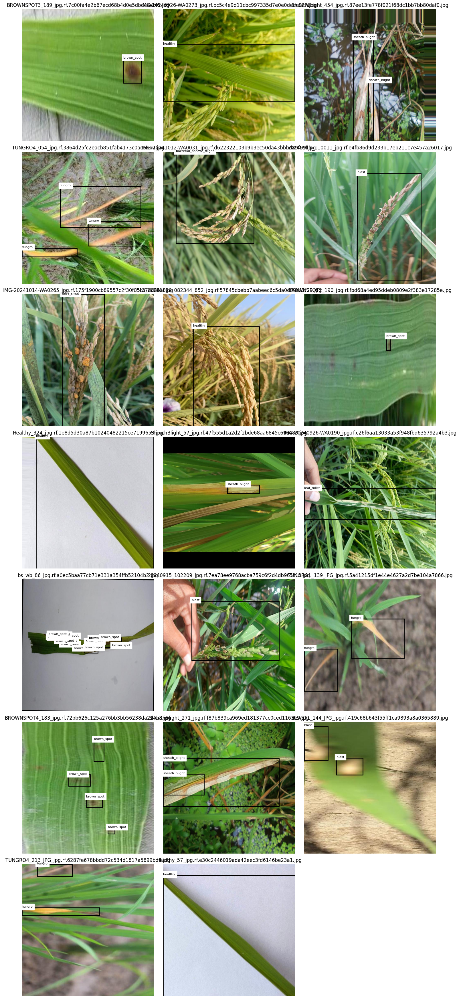

In [19]:
visualisasi_sampel(
    YOLO_OUT,
    split="train",
    sample_size=20
)

In [20]:
import pandas as pd
distribution = {}

for split in ["train", "val", "test"]:

    label_dir = YOLO_OUT / "labels" / split

    counter = Counter()

    for label_path in label_dir.glob("*.txt"):

        lines = label_path.read_text(
            encoding="utf-8"
        ).splitlines()

        for line in lines:

            if not line.strip():
                continue

            class_id = int(line.split()[0])

            counter[class_id] += 1

    distribution[split] = counter

df = pd.DataFrame({
    "class": CLASS_NAMES,

    "train": [
        distribution["train"][i]
        for i in range(len(CLASS_NAMES))
    ],

    "val": [
        distribution["val"][i]
        for i in range(len(CLASS_NAMES))
    ],

    "test": [
        distribution["test"][i]
        for i in range(len(CLASS_NAMES))
    ],
})


df["total"] = (
    df["train"]
    + df["val"]
    + df["test"]
)


df = df.sort_values(
    "total",
    ascending=False
).reset_index(drop=True)


print(df)

                       class  train   val  test  total
0                 brown_spot   5010  1461   840   7311
1                      blast   4149   947   535   5631
2                     tungro   2540   760   411   3711
3                    healthy   2374   424   184   2982
4              sheath_blight   1762   488   269   2519
5                 leaf_scald   1438   390   222   2050
6                 false_smut    852    86    43    981
7                leaf_roller    812    87    44    943
8      bacterial_leaf_blight    476   125    59    660
9   bacterial_panicle_blight    528    45    27    600
10              narrow_brown    222    75    36    333


In [21]:
%pip install ultralytics albumentations

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.5/46.5 kB 941.2 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 23.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.4/78.4 kB 4.6 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [22]:
import albumentations as A
custom_transforms = [
    A.RandomSizedBBoxSafeCrop(height=640, width=640, p=0.3),
    A.CLAHE(clip_limit=4.0, p=0.3),
    A.GaussNoise(std_range=(0.0124, 0.0277), p=0.1),
]

In [23]:
from ultralytics import YOLO

model_yolo12s= YOLO("yolo12s.yaml")

results_yolo12s= model_yolo12s.train(
    data=str(YOLO_OUT / "data.yaml"),

    epochs=300,
    batch=32,
    imgsz=640,
    weight_decay=0.001,
    save_period=100,
    pretrained=False,
    seed=SEED,
    hsv_h=0.0,
    hsv_s=0.2,
    hsv_v=0.2,
    translate=0.1,
    shear=0.0,
    copy_paste=0.2,
    copy_paste_mode="flip",
    perspective=0,
    scale=0.0,
    fliplr=0.5,
    flipud=0.5,
    mosaic=0.2,
    erasing=0.1,
    auto_augment=None,
    patience=0,
    cos_lr=True,

    augmentations=custom_transforms,
    device=[0,1],

    project="/kaggle/working/",
    name="train_yolo_12s",
    exist_ok=True
)

Creating new Ultralytics Settings v0.0.8 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/usage/settings.
Ultralytics 8.4.156 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14912MiB)
                                                        CUDA:1 (Tesla T4, 14912MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, augmentations=[{'__version__': '2.0.8', 'transform': {'__class_fullname__': 'RandomSizedBBoxSafeCrop', 'p': 0.3, 'erosion_rate': 0.0, 'height': 640, 'interpolation': 1, 'mask_interpolation': 0, 'width': 640}}, {'__version__': '2.0.8', 'transform': {'__class_fullname__': 'CLAHE', 'p': 0.3, 'clip_limit': (1.0, 4.0), 'tile_grid_size': (8, 8)}}, {'__version__': '2.0.8', 'transform': {'__class_fullname__': 'GaussNoise', 'p': 0.1, 'mean_range': (0.0, 0.0), 'noise_scale

/usr/local/lib/python3.12/dist-packages/ray/train/_internal/session.py:676: UserWarning: `get_trial_id` is meant to only be called inside a function that is executed by a Tuner or Trainer. Returning `None`.
  warnings.warn(



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      2/300      6.17G          3      4.196      3.551         32        640: 100% ━━━━━━━━━━━━ 315/315 2.6it/s 1:59
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 33/33 3.0it/s 10.9s
                   all       2093       4887      0.426      0.168      0.101     0.0353

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      3/300      6.03G      2.437      3.335      2.822         25        640: 100% ━━━━━━━━━━━━ 315/315 2.8it/s 1:53
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 33/33 3.1it/s 10.8s
                   all       2093       4887      0.224      0.153      0.104     0.0481

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      4/300      7.27G      2.195      3.077      2.519         38        640: 100% ━━━━━━━━━

In [24]:
best_model= YOLO("/kaggle/working/train_yolo_12s/weights/best.pt")

In [25]:
metrics = best_model.val(
    data=str(YOLO_OUT / "data.yaml"),
    split="val",
    imgsz=640
)

Ultralytics 8.4.156 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14912MiB)
YOLO12s summary (fused): 159 layers, 9,235,137 parameters, 0 gradients, 23.2 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1515.6±522.6 MB/s, size: 48.6 KB)
val: Scanning /kaggle/working/YOLO_Dataset/labels/val.cache... 2093 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 2093/2093 462.0Mit/s 0.0s
val: /kaggle/working/YOLO_Dataset/images/val/rtf_38_jpg.rf.2131d44635500a76448ff693d761baa1.jpg: 1 duplicate labels removed
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 131/131 3.6it/s 36.1s
                   all       2093       4887      0.721      0.703        0.7       0.47
 bacterial_leaf_blight         69        125      0.539      0.544      0.478      0.218
bacterial_panicle_blight         45         45      0.656      0.805      0.728      0.543
                 blast        382        947       0.69      0.499      0.544  

In [26]:
precision = metrics.box.mp
recall = metrics.box.mr

if precision + recall > 0:
    f1 = (
        2 * precision * recall
        / (precision + recall)
    )
else:
    f1 = 0

print("F1-score :", f1)

F1-score : 0.7120194597373635


In [27]:
final_metrics = best_model.val(
    data=str(YOLO_OUT/"data.yaml"),
    split="test",
    imgsz=640
)

print(
    "Test mAP50 :",
    final_metrics.box.map50
)

print(
    "Test mAP50-95 :",
    final_metrics.box.map
)

test_precision = final_metrics.box.mp
test_recall = final_metrics.box.mr

if test_precision + test_recall > 0:

    test_f1 = (
        2 * test_precision * test_recall
        / (test_precision + test_recall)
    )

else:
    test_f1 = 0

print(
    "Test Precision :",
    test_precision
)

print(
    "Test Recall    :",
    test_recall
)

print(
    "Test F1-score  :",
    test_f1
)

Ultralytics 8.4.156 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14912MiB)
YOLO12s summary (fused): 159 layers, 9,235,137 parameters, 0 gradients, 23.2 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 977.6±290.2 MB/s, size: 30.9 KB)
val: Scanning /kaggle/working/YOLO_Dataset/labels/test... 1054 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 1054/1054 1.4Kit/s 0.8s
val: /kaggle/working/YOLO_Dataset/images/test/rtf_43_jpg.rf.8f5cea06bb2ce124569df84dec45f100.jpg: 1 duplicate labels removed
val: New cache created: /kaggle/working/YOLO_Dataset/labels/test.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 66/66 3.5it/s 18.7s
                   all       1054       2669      0.754      0.709      0.712      0.501
 bacterial_leaf_blight         29         59      0.506      0.508      0.403       0.21
bacterial_panicle_blight         27         27      0.959      0.926       0.95      0.669
                 